In [1]:
import numpy as np
import pandas as pd
import lasio
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

# formatting parameters for charts
plt.rcParams["font.size"] = 11
plt.rcParams["figure.figsize"] = (18., 10.)
#plt.rcParams["figure.dpi"] = 400
plt.rcParams["lines.markersize"] = 6
#plt.rcParams["lines.markeredgewidth"] = 0.0
plt.rcParams["lines.markeredgewidth"] = 0.1
plt.rcParams['patch.edgecolor'] = 'k'
plt.rcParams['patch.linewidth'] = 0.1


#set home directory for python scripts
%cd C:\Users\joanna.wallis\Documents\Github\FORCE\Public\ 
    
from Clustering import create_clustering_database, facies_clustering
    
# The clustering is performed on the 100WTR logs only to ensure that these are clustered by FACIES, not FLUID.    
    

C:\Users\joanna.wallis\Documents\Github\FORCE\Public


In [2]:
# root for las files to be used for clustering
# expects filenames in format: [root]\\[well]_[scenario].las
root = r'C:\Users\joanna.wallis\Documents\FORCE_presentation\example_well_log'
wells = ["WELL"]
water_scenarios = ["100WTR"]
null = -999.25

cols_to_cluster = ["Vp", "RhoB","Vsh", "PhiE"] #
vsh_log = "Vsh"

# option to set number of classes
set_num_classes = True
num_classes = 3



In [4]:
well_data = create_clustering_database(root, wells, water_scenarios, cols_to_cluster)
print (well_data.head())

         DEPTH  Bulk Modulus  Shear Modulus   Vp/Vs      AI      SI  \
21072  10536.0        14.761         4.6999  2.1152  6981.5  3300.6   
21073  10536.0        15.003         4.5604  2.1502  7138.6  3320.0   
21074  10536.0        14.990         4.7617  2.1169  7091.9  3350.1   
21076  10537.0        14.890         4.4842  2.1573  7093.4  3288.1   
21078  10538.0        15.855         5.2997  2.0797  7452.4  3583.4   

       Poisson's Ratio  Lambda-Rho  Mu-Rho      Vp    ...      Sw       Md m  \
21072          0.35607      26.953  10.894  3011.9    ...     1.0  3211.3728   
21073          0.36200      28.914  11.023  2953.5    ...     1.0  3211.3728   
21074          0.35638      27.849  11.223  3008.9    ...     1.0  3211.3728   
21076          0.36316      28.693  10.811  2942.1    ...     1.0  3211.6776   
21078          0.34962      29.856  12.841  3075.7    ...     1.0  3211.9824   

          TVDKB m    TVDKB ft     TVDSS m     TVDML m    TVDSS ft    TVDML ft  \
21072  3209

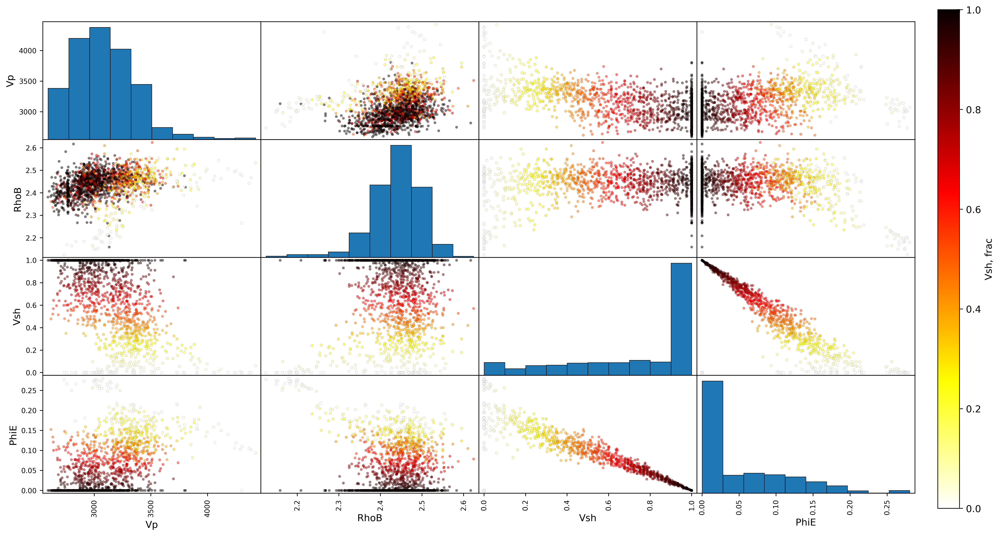

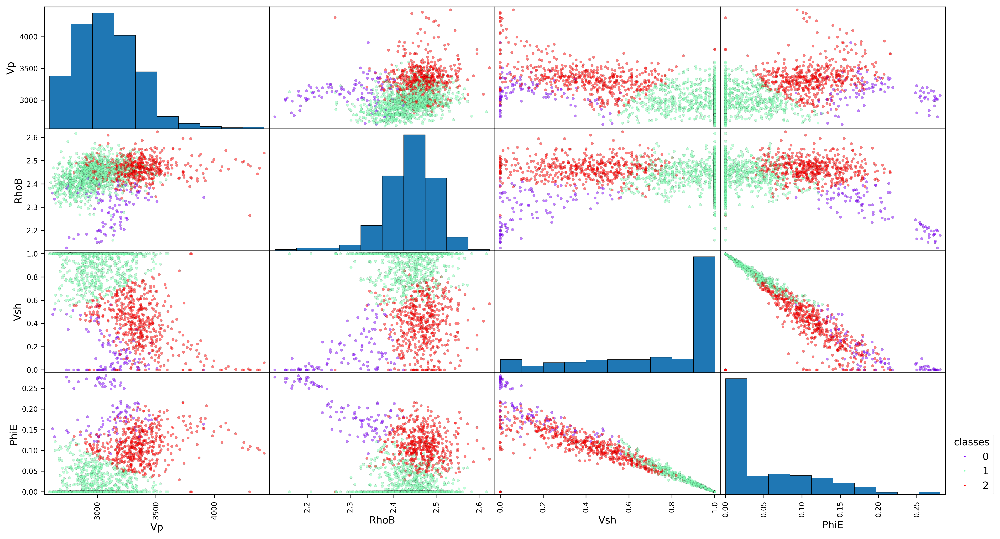

In [5]:
clustered_data, database_filename = facies_clustering(well_data, cols_to_cluster, vsh_log, set_num_classes, num_classes)

# N.B. Be a little patient with this one - it has a lot to do!

In [6]:
print ("Output database file: %s" %database_filename)
print ("Brief look at database entries:")
print (clustered_data.head())

Output database file: C:\Users\joanna.wallis\Documents\FORCE_presentation\example_well_log\All_wells_100WTR_labels.txt
Brief look at database entries:
         DEPTH  Bulk Modulus  Shear Modulus   Vp/Vs      AI      SI  \
21072  10536.0        14.761         4.6999  2.1152  6981.5  3300.6   
21073  10536.0        15.003         4.5604  2.1502  7138.6  3320.0   
21074  10536.0        14.990         4.7617  2.1169  7091.9  3350.1   
21076  10537.0        14.890         4.4842  2.1573  7093.4  3288.1   
21078  10538.0        15.855         5.2997  2.0797  7452.4  3583.4   

       Poisson's Ratio  Lambda-Rho  Mu-Rho      Vp   ...         Md m  \
21072          0.35607      26.953  10.894  3011.9   ...    3211.3728   
21073          0.36200      28.914  11.023  2953.5   ...    3211.3728   
21074          0.35638      27.849  11.223  3008.9   ...    3211.3728   
21076          0.36316      28.693  10.811  2942.1   ...    3211.6776   
21078          0.34962      29.856  12.841  3075.7   ... 